<h1>Using diffusion model to generate H&E images from Raman image</h1>

This notebook is a demo for showing how to generate H&E images using processed Raman image as the conditioning information.

<h2>1. Preparetion</h2>
As the initial step, several modules and functions should be imported and implemented.

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import make_s_curve
import torch
from torch import nn
import time

import os, sys

import repo_SD_DDPM as module
from repo_AE import ImgAlignNet, parseCheckPoint, CustomDataset, CustomDatasetRANew

from torchvision.transforms import ToPILImage
import matplotlib.pyplot as plt
import numpy as np
import torch.nn.functional as F


In [2]:
def plotDM(outArrs,steps=1000):
    fig,axs = plt.subplots(1,10,figsize=(48,12))
    for i in range(1,11):
        cur_x = outArrs[i*steps//10].detach()
        image_pil = to_pil(cur_x.squeeze(0))
        axs[i-1].imshow(image_pil,cmap=None)
        axs[i-1].set_axis_off();
        axs[i-1].set_title('$q(\mathbf{x}_{'+str(i*steps//10)+'})$')
    plt.show()

<h2>2. Dataset create and tensor export</h2>
We have developed the related CustomData in 'repo_AE' for training, but here we can simply use the raw data after training the prarameters. And thus the parameters <b>splitHLen</b>, <b>splitWLen</b>, <b>splitStried</b> can be set to any value since they are for splitting the images when training.<br><br>
Considiering generating H&E image only need Raman image, thus H&E images don't need to be loaded.<br>
Moreover, the Normal and TSCC Raman images were concatenated into a batch, where the first 8 images are Normal and the rest 8 are TSCC.

In [3]:
RANormalDS = CustomDatasetRANew('./data/RAOriFP16/Normal/',channelNum=None,splitHLen=400,splitWLen=50,splitStriedH=34,splitStriedW=9,halfSize=False)
RATSCCDS = CustomDatasetRANew('./data/RAOriFP16/Cancer/',channelNum=None,splitHLen=400,splitWLen=50,splitStriedH=34,splitStriedW=9,halfSize=False)

In [4]:
RANormal = RANormalDS.exportRawData()
RATSCC = RATSCCDS.exportRawData()
RA = torch.cat([RANormal,RATSCC],dim=0)

<h2>3. Generate the H&E images through diffusion model</h2>
The diffusion model is implemented using a UNet consist of several convolution layers attention layers. The H&E images can be generated during the reverse loops from a noise image. The conditioning information is generated from Raman image using an attention-like operation of ImgAlignNet.

Loading the parameters for both ImgAlignNet and diffusion UNet.

In [5]:
device = 'cuda'
dtype = torch.float16

RAModelCP = 'bestSataDict_ImgAlignNet.pt'
RAModel = ImgAlignNet(imgDimIn=3,RADimIn=1340,targetInitDim=64,
                   midDim=128,
                 clsNum=2, targetTransLayerNum=3,
                 targetNum=16, targetSize=(4,4),  imgStride=(4,4), raStride=(4,4), 
                  RAFNum=[512,256,64],
                 imgFNum=[16,32,64],
                 RAAECPPath = None, imgAECPPath = None,
                 dropout_rate=0.15)
RAModel.load_state_dict(parseCheckPoint(RAModelCP))


bestState_dict_path = 'bestSataDict_UNET 128p.pt'
model = module.UNetModel(
        in_channels=3,
        model_channels=128,
        cond_channels=128,
        out_channels=3,
        num_res_blocks=2,
        attention_resolutions=( 8, 16),
        dropout=0.15,
        channel_mult=(1, 1, 1, 2, 2),
        conv_resample=True,
        num_heads=4
        )
model.load_state_dict(parseCheckPoint(bestState_dict_path))

GD = module.GaussianDiffusion()

model = model.to(dtype).to(device)
RAModel = RAModel.to(dtype).to(device)

Generating the H&E images.<br>
Considering that diffusion model can generate any size of image as far as the memory is enough, the parameter <b>initRes</b> is provided for adjusting the generation size. In this demo, the size is set to 256, related to the size of 256 x 256.<br><br>
Except the image generation, the related information of prediction is also generated for better visualization.

In [6]:
torch.cuda.empty_cache()
initRes = 256 #Changing this parameter to adjust the size of generated image.
with torch.no_grad():
    model.eval()
    RAModel.eval()
    raData = RA.to(dtype).to(device)
    
    #Generating the conditioning information
    cond = RAModel.generateRACond(raData,1,topK_token=2,topK_patch=4).to(dtype)
    
    #Generating the H&E images
    generated_images = GD.sample(model, initRes, cond, channels=3)
    
    #(optional) Generating the predicted label for better visualization
    logits = RAModel.predictRA(raData).softmax(-1)
    labels = []
    for i,l in enumerate(logits.cpu().numpy()):
        l1 = l*100
        if i < raData.size(0)//2:
            r = 'Normal'
        else:
            r = 'TSCC'
        tmpLabel = 'Ori: %s, Pred: %.2f%% N %.2f%% T' %(r,l1[0],l1[1])
        labels.append(tmpLabel)

Below is a simple way to make a rectangular layout for the generated images.

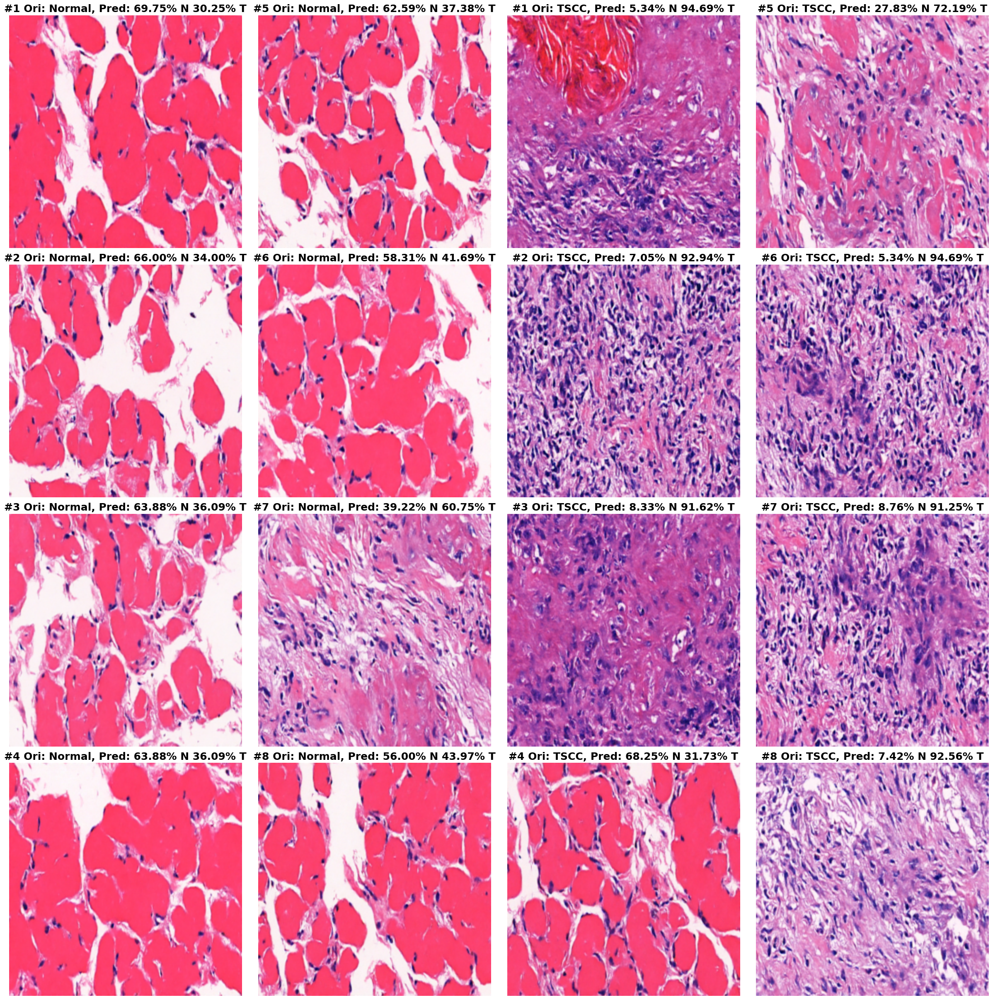

In [7]:
#The basis of layout
f = initRes // 32
s_r = 4
s_c = 4
fig = plt.figure(figsize=(s_c*6, s_r*6), constrained_layout=True)
gs = fig.add_gridspec(s_r, s_c)
imgs = generated_images[-1].reshape(s_c, s_r, 3, 32*f, 32*f)
imgs = imgs.transpose(1,0,2,3,4)

#The title
newLabels = []
for i in range(s_r*s_c):
    t = labels[i]
    num = i %(s_r*s_c//2) + 1
    newLabels.append(f'#{num} {t}')
labelArr = np.array(newLabels)
labelArr = labelArr.reshape(s_c,s_r).T.flatten()

#Visualization
label_count = 0
for n_row in range(s_r):
    for n_col in range(s_c):
        f_ax = fig.add_subplot(gs[n_row, n_col])
        img = np.array((imgs[n_row, n_col].transpose([1, 2, 0])+1.0) * 255 / 2, dtype=np.uint8)
        f_ax.imshow(img)
        f_ax.axis("off")
        f_ax.set_title(labelArr[label_count],fontsize=18,weight='bold')
        label_count += 1
# plt.savefig(f'DM generated img res {initRes}.png',dpi=300) #Uncomment for saving this figure.
plt.show()

Here is the end of this notebook.